# Object Finder
[Implementation](./objectfinder.py)
[Configuration](./ObjectFinder.ini)

The ObjectFinder class performs a sliding window search with the provided classifier. As return value a list of all windows matching the classifer is returned.

## Depth (z) calibration
The search windows are determined by first specifying several depth levels. These correspond to the apparent size of vehicles in the images according to their position.

Parameters:
- lower_left_near, upper_right_near: Bounding box on near z-plane (close to vehicle)
- lower_left_near, upper_right_near: Bounding box on far z-plane (horizon)
- steps_z: amount of intermediate z-planes (interpolated from near to far)

Configurations:
1. **Near: (0,650)-(1280,400), Far: (200,500)-(1080,350), steps_z=5**

The configuration was empirically determined by drawing the bounding boxes on the image.

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


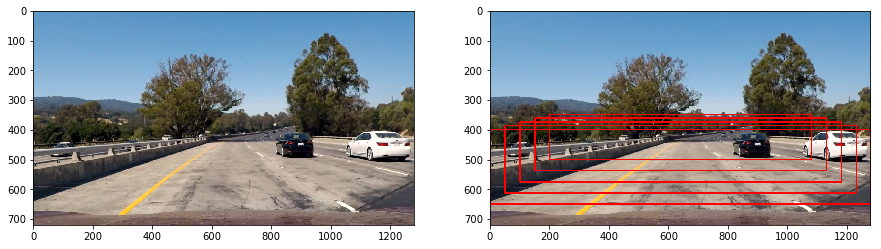

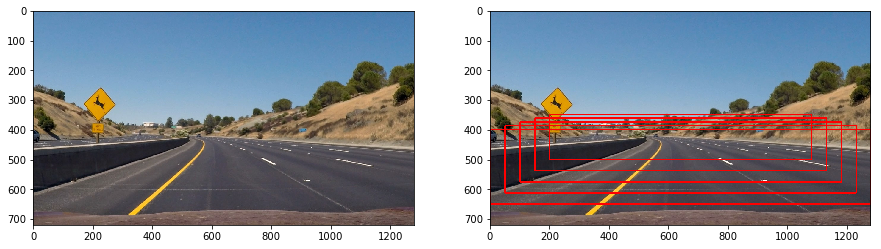

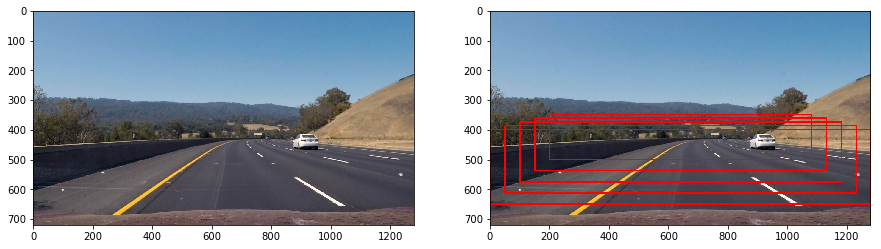

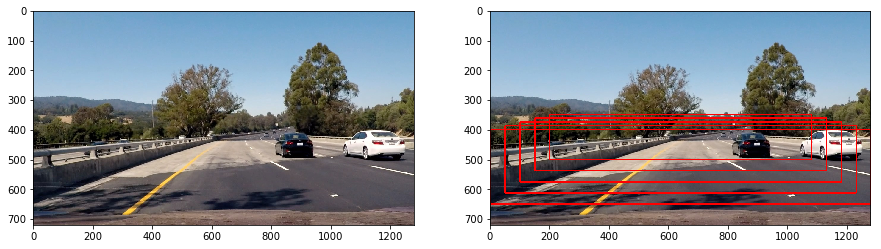

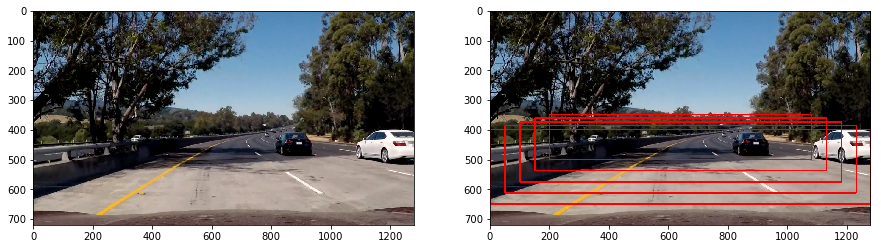

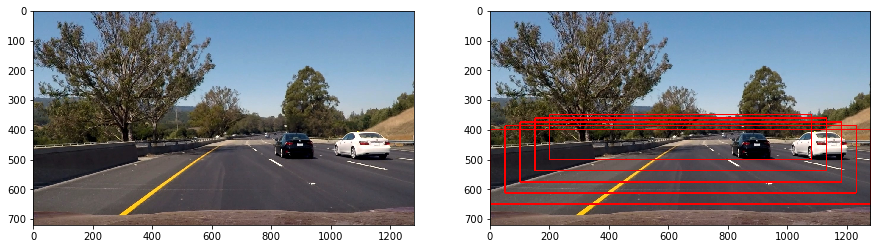

In [4]:
%load_ext autoreload
%autoreload 2

import cv2
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

from images import ImageLoader
from objectfinder import ObjectFinder

img_load = ImageLoader()

test_images = img_load.get_all('test')

config = {'boundingbox' : {'lower_left_near' : '0,650', 'upper_right_near' : '1280,400',
                           'lower_left_far' : '200,500', 'upper_right_far' : '1080,350'},
          'steps' : {'steps_z' : '5'}}        

for img in test_images:
    plt.figure(figsize=(15,5))
    
    plt.subplot(1,2,1)
    plt.imshow(img)

    obj_find = ObjectFinder(img)
    obj_find.set_config(config)
    
    z_boxes, windows = obj_find._get_z_boxes()

    img_z_range = np.copy(img)
    for win in z_boxes:
        cv2.rectangle(img_z_range, win[0], win[1], [1,0,0], thickness=3)
    
    plt.subplot(1,2,2)
    plt.imshow(img_z_range)
    plt.show()
    
obj_find.write_config()

## Sliding windows
As next step on each z-plane a sliding window in x and y direction is used to provide several search windows.

Parameters:
- steps_x, steps_y: Amount of windows in x/y filling the bounding box
- window_size_near: Size of the window on the nearest plane
- window_size_far: Size of the window on the farthest plane

The overlap can be tuned by the bounding box size and the window size. Empirically the following configuration by drawing some of the windows (randomly chosen) on the image was determined with about 75% overlap. 

Configurations:
- **steps=16,4, window_size_near=160,160, window_size_far=80,80**

In [ ]:
%load_ext autoreload
%autoreload 2

import cv2
import matplotlib.pyplot as plt
import numpy as np
import random
%matplotlib inline

from images import ImageLoader
from objectfinder import ObjectFinder

img_load = ImageLoader()

test_images = img_load.get_all('test')

config = {'steps' : {'steps_x' : 16, 'steps_y' : 4},
          'window' : {'window_size_near' : '160,160', 'window_size_far' : '80,80'}}

for img in test_images:
    plt.figure(figsize=(20,5))
    
    plt.subplot(1,3,1)
    plt.imshow(img)

    obj_find = ObjectFinder(img)
    obj_find.set_config(config)
        
    windows, z_boxes = obj_find._get_windows()
    
    img_win1 = np.copy(img)
    for win in random.sample(windows[0],20):
        cv2.rectangle(img_win1, win[0], win[1], [1,0,0], thickness=3)
    plt.subplot(1,3,2)
    plt.imshow(img_win1)
    
    img_win2 = np.copy(img)
    for win in random.sample(windows[-1],20):
        cv2.rectangle(img_win2, win[0], win[1], [1,0,0], thickness=3)
    plt.subplot(1,3,3)
    plt.imshow(img_win2)
    plt.show()
    
print('Number of windows: %d' % (len(windows)*len(windows[0])))

## Save configuration
Finally we can save the sliding window configuration for later use.

In [ ]:
from objectfinder import ObjectFinder

obj_find = ObjectFinder()

config = {'boundingbox' : {'lower_left_near' : '0,650', 'upper_right_near' : '1280,400',
                           'lower_left_far' : '200,500', 'upper_right_far' : '1080,350'},
          'steps' : {'steps_z' : '5', 'steps_x' : 16, 'steps_y' : 4},
          'window' : {'window_size_near' : '160,160', 'window_size_far' : '80,80'}}

obj_find.set_config(config)
obj_find.write_config()

## Window matches
The sliding windows are now matched with the classifiers previously saved to the pickle files. The classifiers are tested with the provided test image to choose the best one. 

### SVC:
As expected the **first SVM classifier** with the highest test scort (>99%) performed best (very last in the image output). The other SVM classifiers with rbf kernels also perform quite well, while the linear kernel shows several false positives.

### DTC:
The decision tree classifiers are garbage. Too many false positives to continue working with them.

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
--------------------------------------------
Classifier: ./classifiers/clf_dt1.pkl


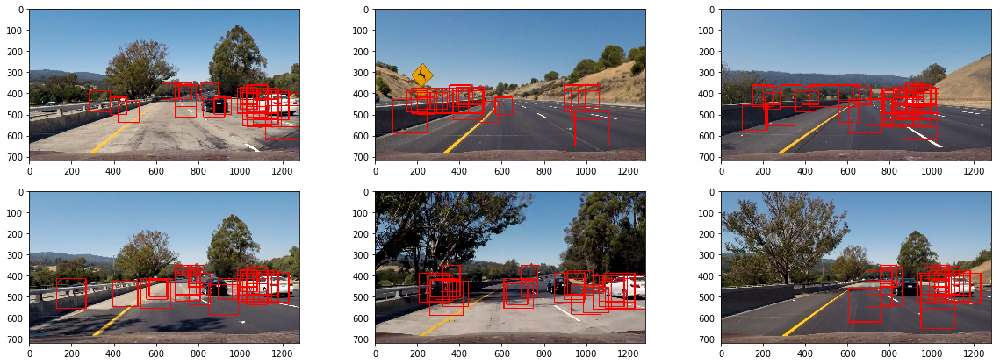

--------------------------------------------
Classifier: ./classifiers/clf_dt2.pkl


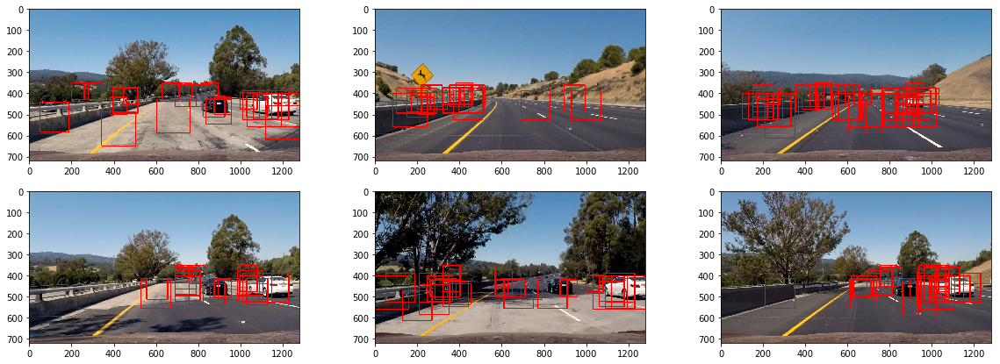

--------------------------------------------
Classifier: ./classifiers/clf_dt3.pkl


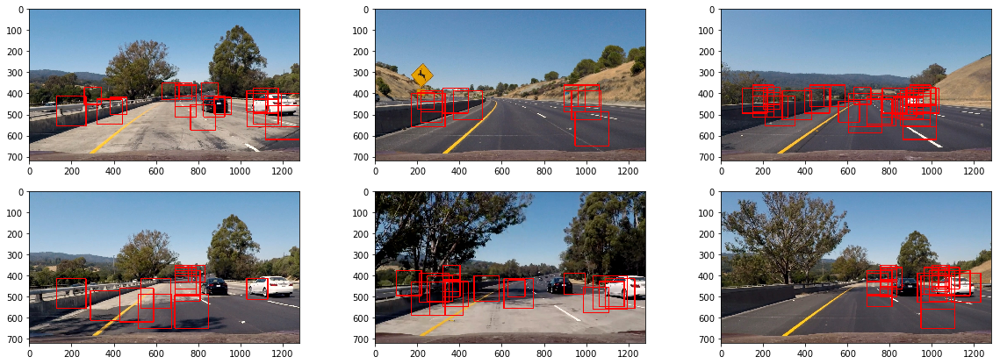

--------------------------------------------
Classifier: ./classifiers/clf_dt4.pkl


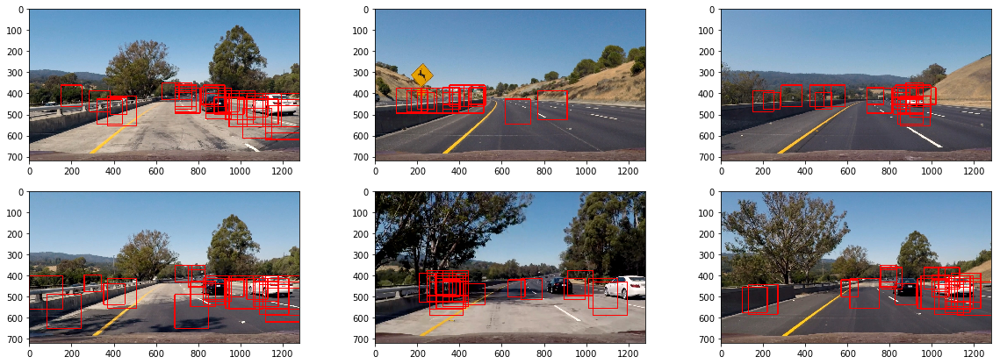

--------------------------------------------
Classifier: ./classifiers/clf_dt5.pkl


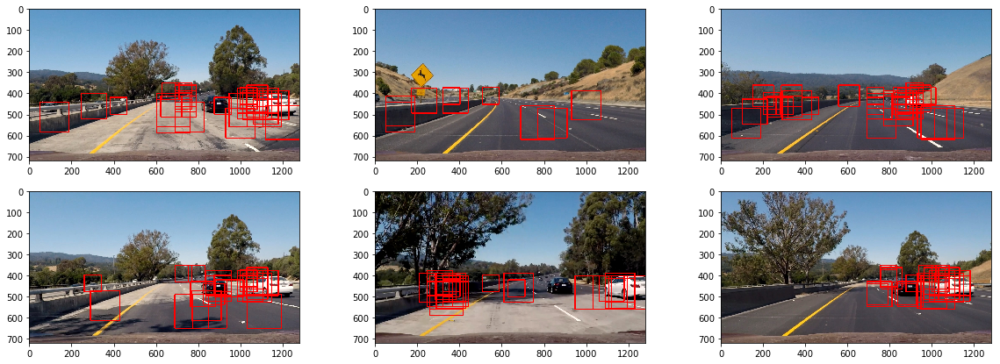

--------------------------------------------
Classifier: ./classifiers/clf_svm1.pkl


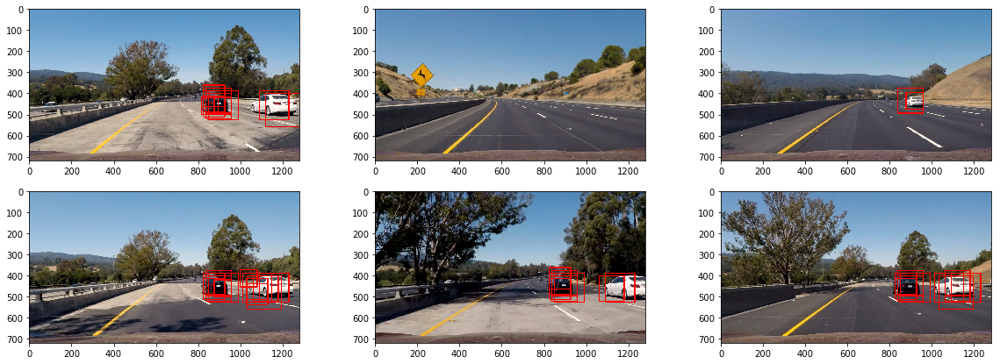

--------------------------------------------
Classifier: ./classifiers/clf_svm2.pkl


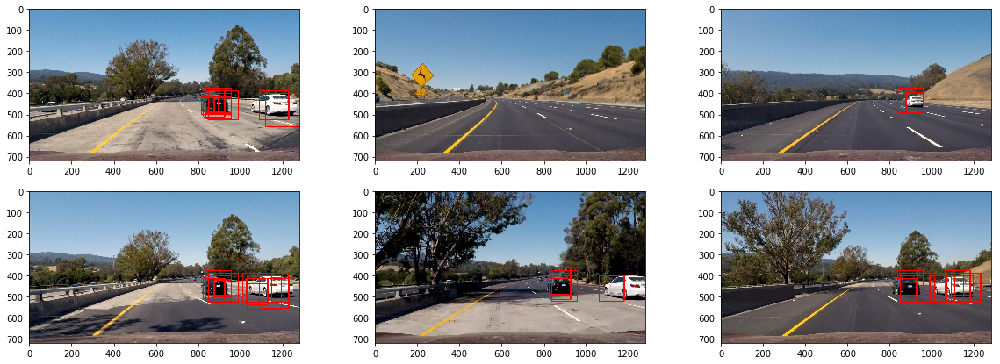

--------------------------------------------
Classifier: ./classifiers/clf_svm3.pkl


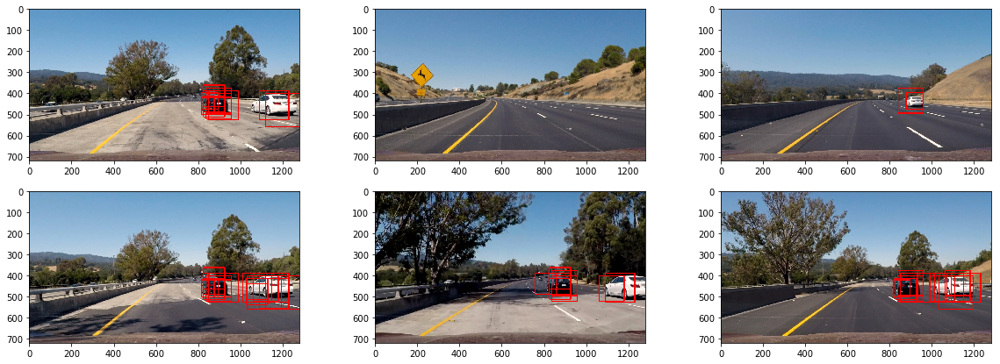

--------------------------------------------
Classifier: ./classifiers/clf_svm4.pkl


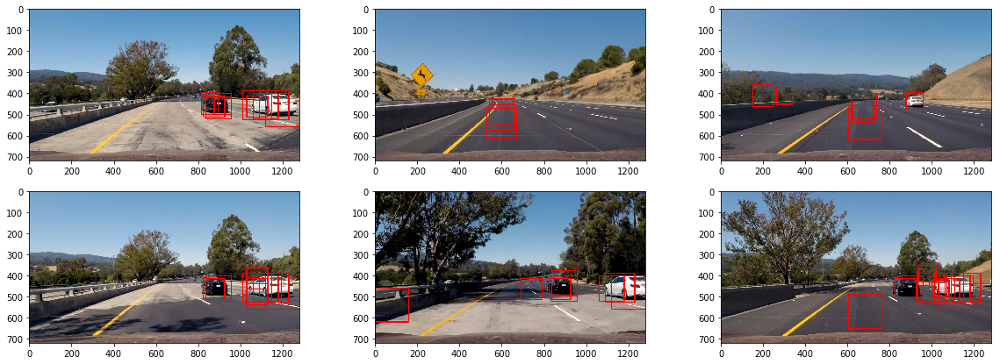

--------------------------------------------
Classifier: ./classifiers/clf_svm5.pkl


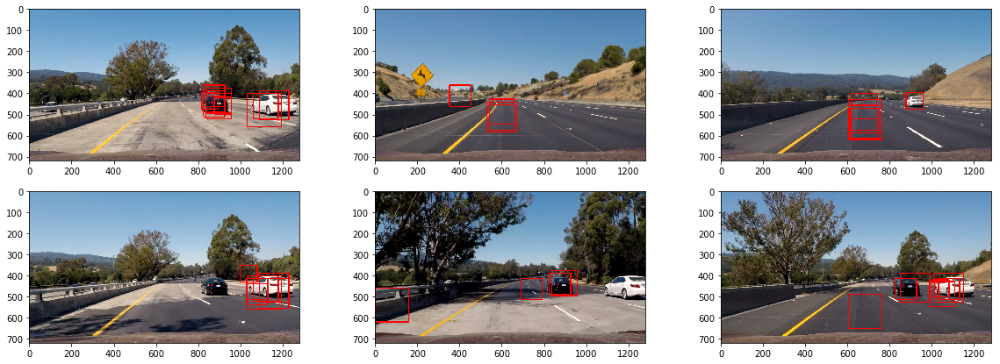

--------------------------------------------
Classifier: ./classifiers/clf_svm6.pkl


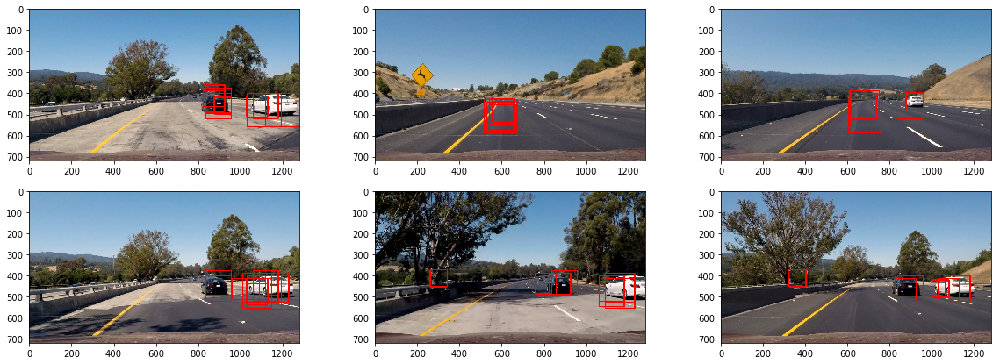

--------------------------------------------
Classifier: ./classifier.pkl


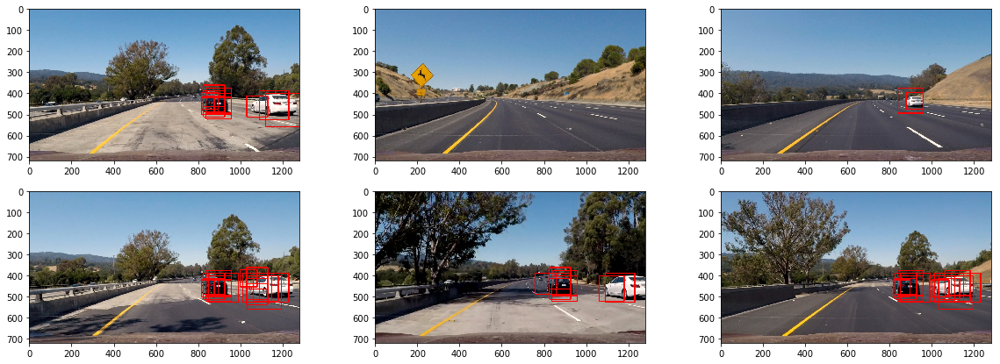

In [12]:
%load_ext autoreload
%autoreload 2

import cv2
import matplotlib.pyplot as plt
import numpy as np
import random
%matplotlib inline

from images import ImageLoader
from objectfinder import ObjectFinder

img_load = ImageLoader()

classifiers = ['clf_dt1.pkl', 'clf_dt2.pkl', 'clf_dt3.pkl', 'clf_dt4.pkl', 'clf_dt5.pkl',
               'clf_svm1.pkl', 'clf_svm2.pkl', 'clf_svm3.pkl','clf_svm4.pkl', 'clf_svm5.pkl', 'clf_svm6.pkl']
classifiers = ['./classifiers/' + c for c in classifiers]
classifiers.append('./classifier.pkl') # Fully trained first SVC, should perform best

for clf_file in classifiers:
    print('--------------------------------------------')
    print('Classifier: %s' % clf_file)
    obj_find = ObjectFinder(clf=clf_file)
    obj_find.set_config(config)

    test_images = img_load.get_all('test')

    plt.figure(figsize=(20,7))
    for idx,img in enumerate(test_images):    
        win_match = obj_find.get_window_matches(img)

        img_obj = np.copy(img)
        for win in win_match:
            cv2.rectangle(img_obj, win[0], win[1], [1,0,0], thickness=3)

        plt.subplot(2,3,idx+1)
        plt.imshow(img_obj)
    plt.show()

## Test on videos
The first SVC classifier is now tested on the short and full video. The videos are quite promising showing only few false positives and detecting all vehicles. So final decision is to continue working with the SVC (rbf, C=1) classifier.

In [8]:
%load_ext autoreload
%autoreload 2

from moviepy.editor import VideoFileClip
import numpy as np
import cv2
import matplotlib.pyplot as plt

from objectfinder import ObjectFinder

obj_find = ObjectFinder(clf='./classifier.pkl')

# callback function for VideoFileClip
def process_video(image):
    win_match = obj_find.get_window_matches(image.astype(np.float32) / 255)
    
    img_obj = np.copy(image)
    for win in win_match:
        cv2.rectangle(img_obj, win[0], win[1], [255,0,0], thickness=3)
    return img_obj

# Short test video
video_input = './test_video.mp4'
video_output = './videos/test_video_clf_test.mp4'

#clip = VideoFileClip(video_input)
#lane_clip = clip.fl_image(process_video)
#lane_clip.write_videofile(video_output, audio=False)

# Full project video
video_input = './project_video.mp4'
video_output = './videos/project_video_clf_test.mp4'

clip = VideoFileClip(video_input)
lane_clip = clip.fl_image(process_video)
lane_clip.write_videofile(video_output, audio=False)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
[MoviePy] >>>> Building video ./videos/project_video_clf_test.mp4
[MoviePy] Writing video ./videos/project_video_clf_test.mp4


100%|███████████████████████████████████████████████████████████████████████████▉| 1260/1261 [1:30:45<00:04,  4.61s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./videos/project_video_clf_test.mp4 



In [5]:
from IPython.display import HTML
HTML("""
<video width="480" height="360" controls>
  <source src="./videos/test_video_clf_test.mp4" type="video/mp4">
</video>
""")

In [7]:
from IPython.display import HTML
HTML("""
<video width="480" height="360" controls>
  <source src="./videos/project_video_clf_test.mp4" type="video/mp4">
</video>
""")